In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from pandas.plotting import register_matplotlib_converters
from datetime import timedelta
from time import time

In [2]:
d_parser = lambda x : datetime.strptime(x,"%d.%m.%Y %H:%M:%S.%f")

In [3]:
df1 = pd.read_csv('data/211002_E40/E40_2021-10-02_10.28.13.txt',sep='\t',parse_dates=['Time'],date_parser=d_parser)
df2 = pd.read_csv('data/211002_E40/E40_2021-10-02_11.28.12.txt',sep='\t',parse_dates=['Time'],date_parser=d_parser)
df3 = pd.read_csv('data/211002_E40/E40_2021-10-02_12.28.12.txt',sep='\t',parse_dates=['Time'],date_parser=d_parser)
df = pd.concat([df1,df2,df3])
df.set_index('Time',inplace = True)
df.head()

,[0:0],[0:1],[0:2],[0:3],[0:4],[0:6],[0:7],[0:8],[0:10],[0:12],...,[0.199],[0.200],[0.201],[0.202],[0.203],[0.204],[0.205],[0.206],[0.207],[0.208]
Time,,,,,,,,,,,,,,,,,,,,,
2021-10-02 10:28:13.060,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0
2021-10-02 10:28:13.070,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0
2021-10-02 10:28:13.080,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0
2021-10-02 10:28:13.090,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0
2021-10-02 10:28:13.100,-173.984,3689.29,0,0,4,1150,0,0,115,0,...,1,0,0,0,0,0,0,0,0,0


In [13]:
def dimension_reduction(df,size):
    index = []
    x = []
    i = 0
    while (i+size) <= df.shape[0]:
        x.append(df.iloc[i:i+size,:].sum(axis=0))
        index.append(df.index[i])
        i += size
    data =  pd.DataFrame(x,columns=df.columns,index= index)
    return data

In [7]:
new_df = dimension_reduction(df,10)
new_df.head()

,[0:0],[0:1],[0:2],[0:3],[0:4],[0:6],[0:7],[0:8],[0:10],[0:12],...,[0.199],[0.200],[0.201],[0.202],[0.203],[0.204],[0.205],[0.206],[0.207],[0.208]
2021-10-02 10:28:13.060,-1739.84,36892.9,0.0,0.0,40.0,11500.0,0.0,0.0,1150.0,0.0,...,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-02 10:28:13.160,-1739.84,36892.9,0.0,0.0,40.0,11500.0,0.0,0.0,1150.0,0.0,...,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-02 10:28:13.260,-1739.84,36892.9,0.0,0.0,40.0,11500.0,0.0,0.0,1150.0,0.0,...,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-02 10:28:13.360,-1739.84,36892.9,0.0,0.0,40.0,11500.0,0.0,0.0,1150.0,0.0,...,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-02 10:28:13.460,-1739.84,36892.9,0.0,0.0,40.0,11500.0,0.0,0.0,1150.0,0.0,...,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [9]:
def generate_datasets_for_training(data, window_size,scale=True, scaler_type=MinMaxScaler):
    _l = len(data) 
    data = scaler_type().fit_transform(data)
    Xs = []

    for i in range(0, (_l - window_size+1)):
    # because this is an autoencoder - our Ys are the same as our Xs. No need to pull the next sequence of values
        Xs.append(data[i:i+window_size])
  
    return  (np.array(Xs))

In [11]:
window_length = 1
train = generate_datasets_for_training(new_df, window_length)
train.shape

(107999, 1, 270)

In [15]:
from keras import metrics
from tensorflow import keras
import tensorflow as tf
import os

feats = 270

early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', min_delta=1e-3, patience=5, verbose=0, mode='auto',
    baseline=None, restore_best_weights=True)


model = keras.Sequential()
model.add(keras.layers.LSTM(128, kernel_initializer='he_uniform', batch_input_shape=(None, window_length, feats), return_sequences=True, name='encoder_1'))
model.add(keras.layers.LSTM(48, kernel_initializer='he_uniform', return_sequences=True, name='encoder_2'))
model.add(keras.layers.LSTM(16, kernel_initializer='he_uniform', return_sequences=True, name='encoder_3'))
model.add(keras.layers.LSTM(4, kernel_initializer='he_uniform', return_sequences=False, name='encoder_4'))
model.add(keras.layers.RepeatVector(window_length, name='encoder_decoder_bridge'))
model.add(keras.layers.LSTM(4, kernel_initializer='he_uniform', return_sequences=True, name='decoder_1'))
model.add(keras.layers.LSTM(16, kernel_initializer='he_uniform', return_sequences=True, name='decoder_2'))
model.add(keras.layers.LSTM(48, kernel_initializer='he_uniform', return_sequences=True, name='decoder_3'))
model.add(keras.layers.LSTM(128, kernel_initializer='he_uniform', return_sequences=True, name='decoder_4'))
model.add(keras.layers.TimeDistributed(keras.layers.Dense(feats)))
model.compile(loss="mse",optimizer='adam')
model.build()
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_1 (LSTM)            (None, 1, 128)            204288    
                                                                 
 encoder_2 (LSTM)            (None, 1, 48)             33984     
                                                                 
 encoder_3 (LSTM)            (None, 1, 16)             4160      
                                                                 
 encoder_4 (LSTM)            (None, 4)                 336       
                                                                 
 encoder_decoder_bridge (Rep  (None, 1, 4)             0         
 eatVector)                                                      
                                                                 
 decoder_1 (LSTM)            (None, 1, 4)              144       
                                                      

In [16]:
history = model.fit(x=train, y=train, epochs=50, validation_split = 0.1,shuffle=False, callbacks = [early_stop])

Epoch 1/50
3038/3038 [==============================] - 53s 14ms/step - loss: 0.0128 - val_loss: 0.0126
Epoch 2/50
3038/3038 [==============================] - 40s 13ms/step - loss: 0.0087 - val_loss: 0.0066
Epoch 3/50
3038/3038 [==============================] - 41s 14ms/step - loss: 0.0078 - val_loss: 0.0073
Epoch 4/50
3038/3038 [==============================] - 39s 13ms/step - loss: 0.0077 - val_loss: 0.0075
Epoch 5/50
3038/3038 [==============================] - 38s 13ms/step - loss: 0.0077 - val_loss: 0.0075
Epoch 6/50
3038/3038 [==============================] - 38s 13ms/step - loss: 0.0078 - val_loss: 0.0077
Epoch 7/50
3038/3038 [==============================] - 38s 13ms/step - loss: 0.0077 - val_loss: 0.0062


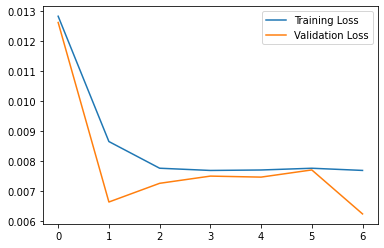

In [17]:
plt.plot(history.history["loss"],label = 'Training Loss')
plt.plot(history.history["val_loss"],label = 'Validation Loss')
plt.legend()
plt.show()

In [18]:
train_pred = model.predict(train)

3375/3375 [==============================] - 16s 4ms/step


In [20]:
def loss(train_pred,train_original, df = new_df ):
    _l = train_pred.shape[0]
    Xs = []
    Ys = []
    for i in range(0, _l):
        Xs.append(train_pred[i][0])
        Ys.append(train_original[i][0])
        
    for j in range(1,train_pred.shape[1]):
        Xs.append(train_pred[_l-1][j])
        Ys.append(train_original[_l-1][j])
    train_pred =np.array(Xs)
    train_original = np.array(Ys)
    loss = np.sum((train_pred-train_original)**2,axis = 1)
    loss = pd.DataFrame(loss, index = df.index)
    
    return loss

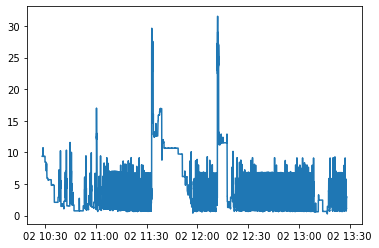

In [21]:
plt.plot(loss(train_pred,train, df= new_df))
plt.savefig('Lstm_train.png')

In [26]:
def pred_loss(file_path):
    df = pd.read_csv(file_path,sep='\t',parse_dates=['Time'],date_parser=d_parser)
    df.set_index('Time',inplace = True)
    new_df = dimension_reduction(df,10)
    train = generate_datasets_for_training(new_df, window_length)
    train_pred = model.predict(train)
    loss1 = loss(train, train_pred, df= new_df)
    return loss1
    

942/942 [==============================] - 5s 6ms/step


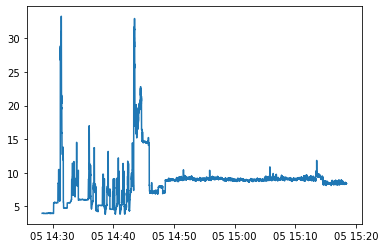

In [29]:
plt.plot(pred_loss('data/211005_E40/E40_2021-10-05_14.28.15.txt'))
plt.savefig('Lstm_test.png')

1125/1125 [==============================] - 6s 5ms/step


/tmp/ipykernel_287773/2676586835.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(18,5))


1125/1125 [==============================] - 5s 4ms/step


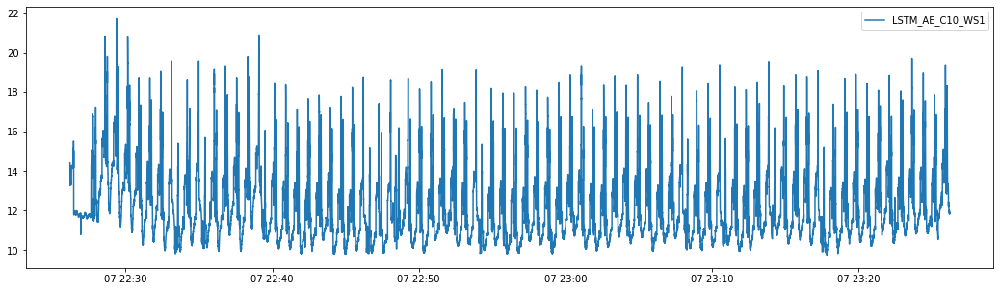

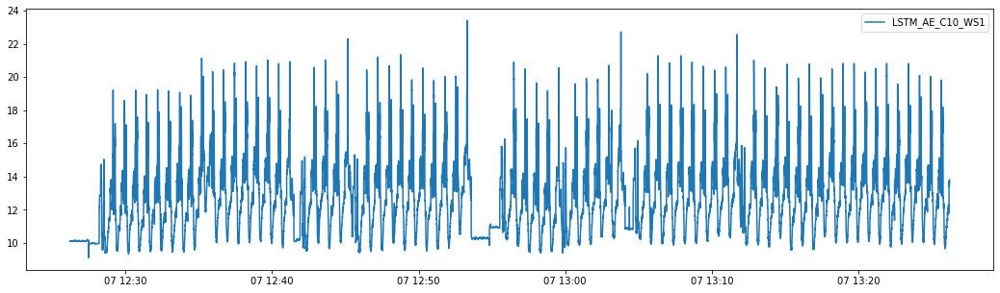

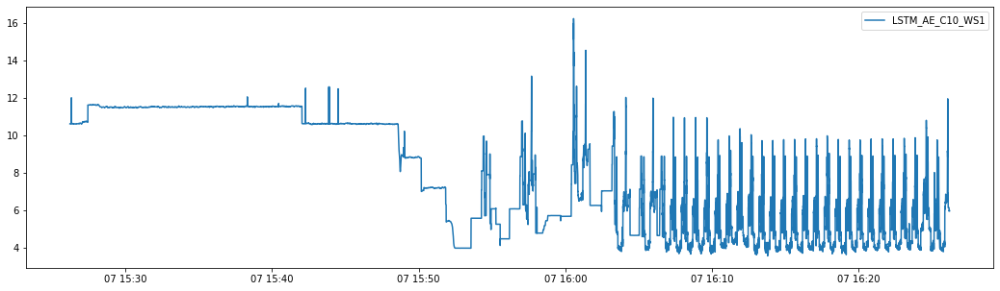

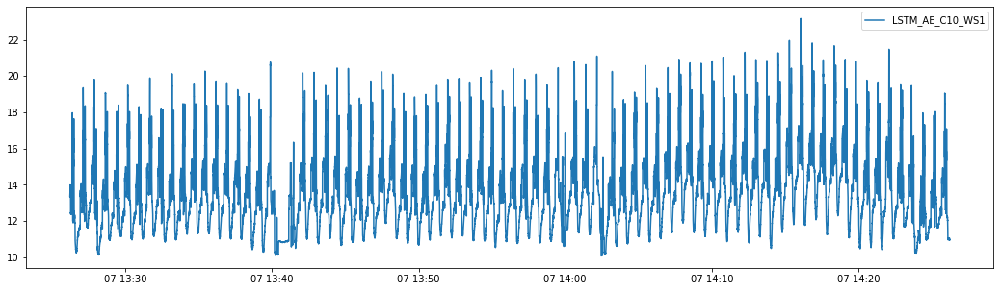

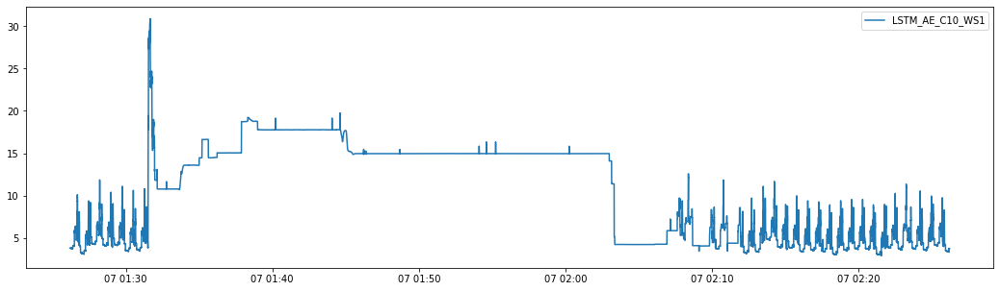

...

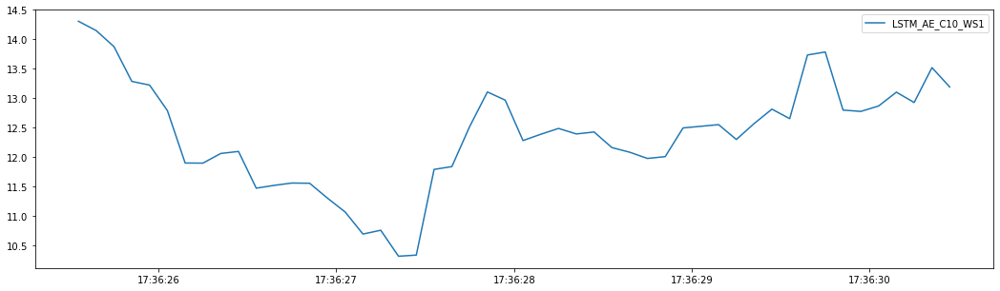

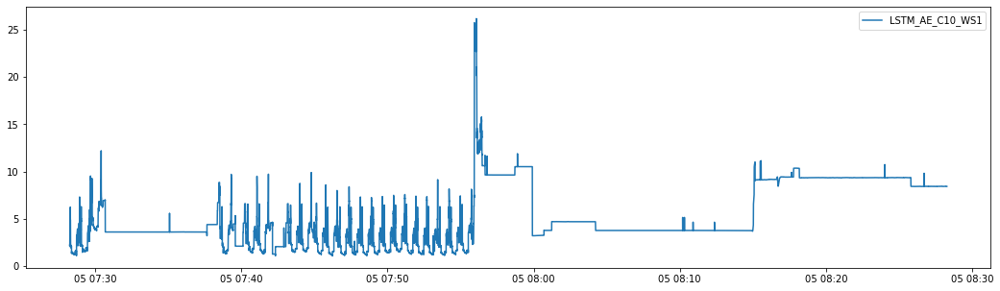

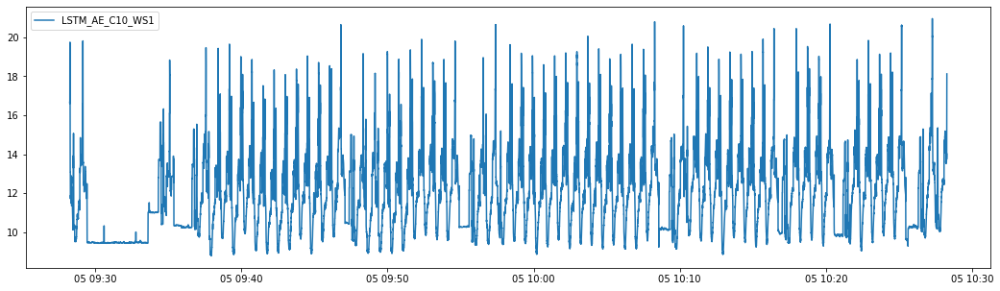

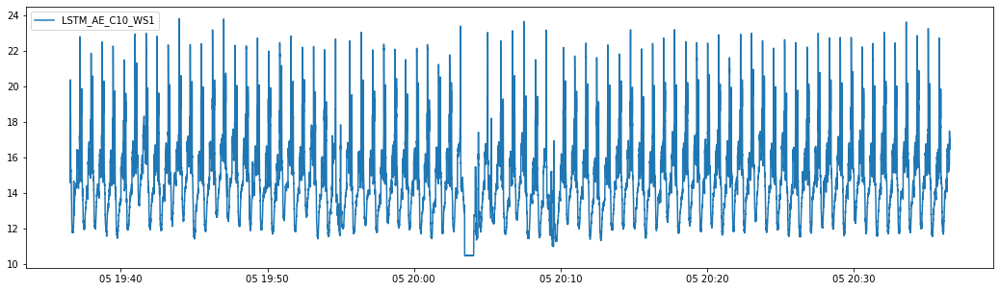

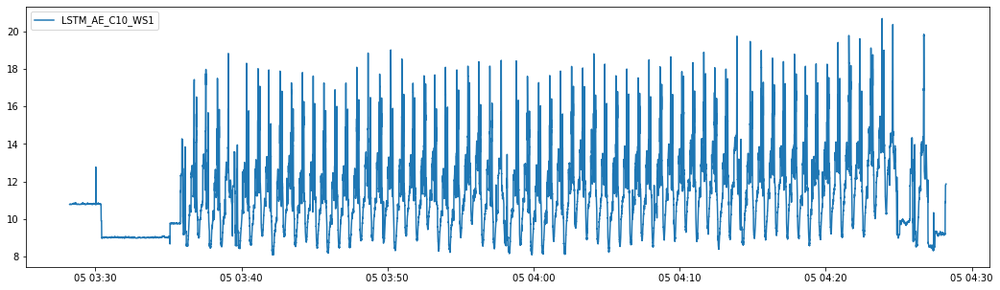

In [28]:
fl = os.getcwd()+"/data"
for files in  os.listdir(fl):
#     print(files)
    if files != '.ipynb_checkpoints':
        for file in os.listdir(fl+'/'+ files):
            if os.path.isfile(fl+"/"+files+'/'+file):
                try:
                    score = pred_loss(fl+"/"+files+'/'+file)
                    plt.figure(figsize=(18,5))
                    plt.plot(score,label='LSTM_AE_C10_WS1')
                    plt.legend()
                    plt.savefig(fl+"/"+files+"/Untitled Folder 5/"+file.replace('.txt','.png'))
                except UnicodeDecodeError:
                    pass
                